In [1]:

# !pip install git+https://github.com/scverse/squidpy.git --user

In [1]:
# import cormerant as cmt
import numpy as np
import pandas as pd
import squidpy as sq
from copy import deepcopy
from scipy.cluster import hierarchy as sch
import scanpy as sc

from matplotlib import pyplot as plt
import os
import pickle
%matplotlib inline

C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\geopandas\_compat.py:123: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\spatialdata\__init__.py:9: UserWarning: Geopandas was set to use PyGEOS, changing to shapely 2.0 with:

	geopandas.options.use_pygeos = True

If you intended to use PyGEOS, set the option to False.
  _check_geopandas_using_shapely()


Going to follow the example [workflow](https://squidpy.readthedocs.io/en/stable/notebooks/examples/graph/compute_ligrec.html) provided by squidpy to run receptor-ligand analysis with a re-implementation of cellphonedb. 

In [2]:
directory = '/Users/DouglasHannumJr/Desktop/s3_bucket_data/s3_bucket_data/'

In [3]:
os.chdir(directory)
os.listdir()

['anndata.h5ad',
 'anndata.pickle',
 'cell_boundaries.parquet',
 'cell_by_gene.csv',
 'cell_metadata.csv',
 'images',
 'neuro_panel_cluster_annotation.csv',
 'partitioned_transcripts.csv',
 'spat.Rds']

In [4]:
# import inspect
# lines = inspect.getsource(sq.read.vizgen)
# print(lines)

In [5]:
adata = sq.read.vizgen(
    directory,
    counts_file = 'cell_by_gene.csv',
    meta_file = 'cell_metadata.csv')

In [6]:
adata

AnnData object with n_obs × n_vars = 78273 × 483
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'

In [7]:
adata.var_names_make_unique()
sc.pp.filter_cells(adata, min_counts = 100)
sc.pp.filter_genes(adata, min_cells = 10)

In [8]:
adata

AnnData object with n_obs × n_vars = 67729 × 483
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'n_counts'
    var: 'n_cells'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'

In [9]:
adata = adata[adata.obs['min_x'] > 5000]

In [10]:
adata

View of AnnData object with n_obs × n_vars = 29669 × 483
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'n_counts'
    var: 'n_cells'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'

In [11]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.scale(adata, max_value = 10)

C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [12]:
resolution = .5
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=resolution)

C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python

C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


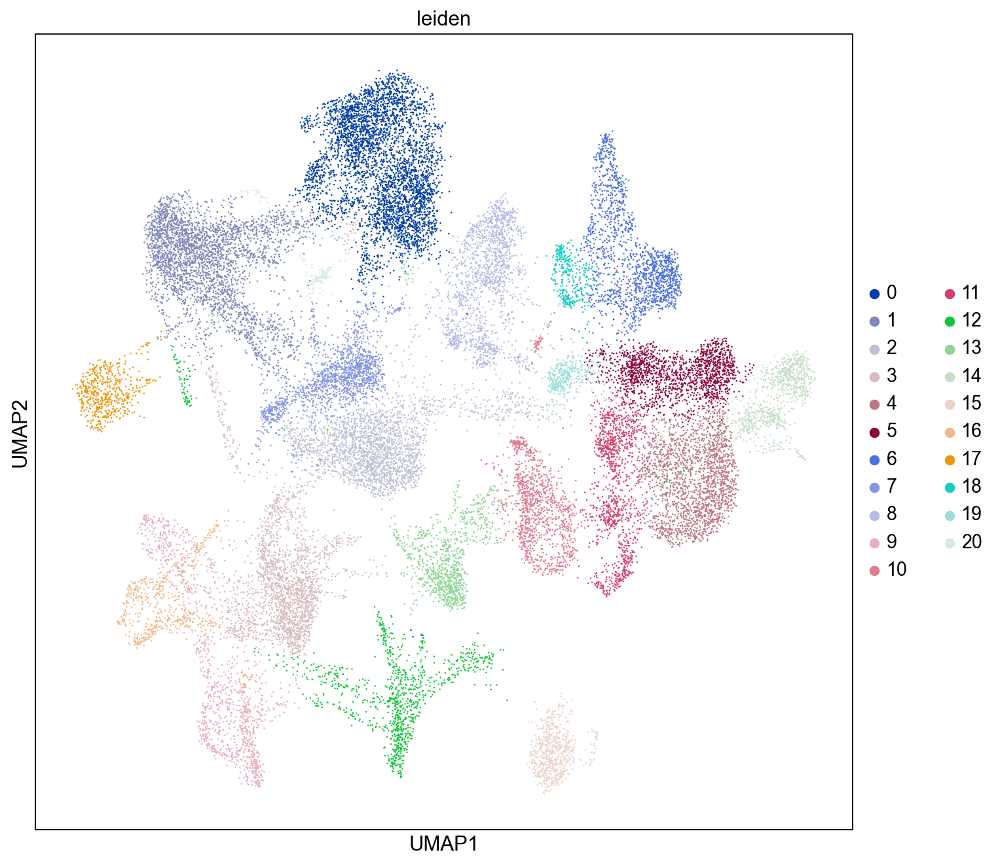

In [13]:
sc.set_figure_params(figsize=(10,10))
sc.pl.umap(adata, color = ['leiden'], size = 5)

C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\squidpy\pl\_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


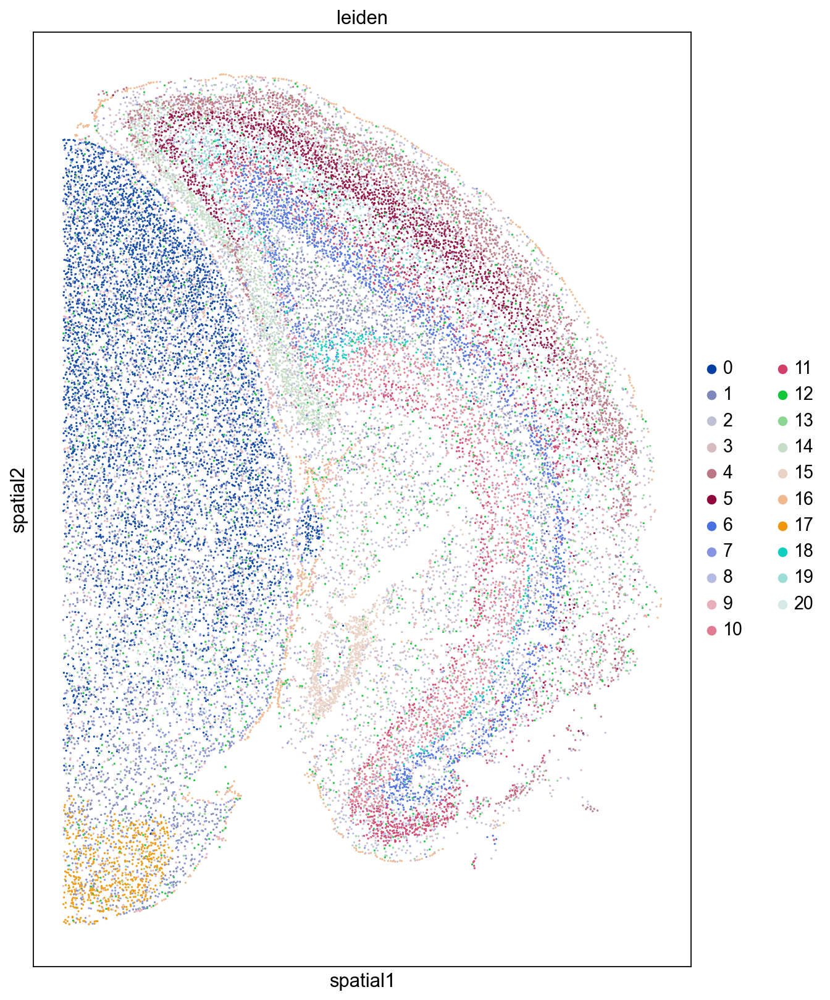

In [14]:
sq.pl.spatial_scatter(
    adata,
    shape = None, color = 'leiden', size = 0.5,
    library_id = 'spatial', figsize=(10,10))

In [15]:
markers = pd.read_csv(directory + 'neuro_panel_cluster_annotation.csv', index_col=0)
markers.index = markers.gene
markers.head()

,gene,Class,ClusterName,Description,Neurotransmitter,Region
gene,,,,,,
Igf2,Igf2,Vascular,VECA,"Vascular endothelial cells, arterial",NaN,CNS
Ngfr,Ngfr,Neurons,SYNOR4,Noradrenergic erector muscle neurons,Noradrenaline,Sympathetic ganglion
Ccnd2,Ccnd2,Neurons,SZNBL,Neuronal intermidate progenitor cells,NaN,"Striatum dorsal, Striatum ventral, Dentate gyrus"
Th,Th,Neurons,SYNOR4,Noradrenergic erector muscle neurons,Noradrenaline,Sympathetic ganglion
Lhx2,Lhx2,Neurons,TEGLU13,"Excitatory neurons, cerebral cortex","Glutamate (VGLUT1,VGLUT2), Nitric oxide",Cortex


In [16]:
adata.var = pd.merge(adata.var, markers, how = 'left', left_index=True, right_index=True)

In [17]:
adata.var.Class.value_counts()

Class
Neurons           106
Vascular           13
Ependymal           5
Oligos              5
Astrocytes          5
Immune              4
PeripheralGlia      3
Name: count, dtype: int64

In [18]:
markers.Class.value_counts()

Class
Neurons           388
Vascular           30
Oligos             27
Ependymal          18
PeripheralGlia     18
Astrocytes         11
Immune              8
Name: count, dtype: int64

In [19]:
%%capture
sc.tl.rank_genes_groups(adata, 'leiden', method = 'wilcoxon')

In [20]:
%%capture
top_markers = pd.DataFrame()
for cluster in adata.obs['leiden'].unique():
    markers_ = adata.uns['rank_genes_groups']['names'][cluster][:10]
    scores = adata.uns['rank_genes_groups']['scores'][cluster][:10]
    top_markers = pd.concat([top_markers,pd.DataFrame({'cluster': [cluster]*10,
                                                   'gene': markers_,
                                                   'scores': scores})])

In [21]:
markers = markers.reset_index(drop = True)

In [22]:
top_markers = pd.merge(top_markers, markers, on = 'gene', how = 'left')

In [23]:
marker_table = pd.crosstab(top_markers.cluster, top_markers.Class)

In [24]:
labels = marker_table.idxmax(axis = 1)

In [25]:
labels.index = labels.index.astype(dtype = 'int')

In [26]:
labels = labels.sort_index()

In [27]:
labels.name = 'cluster_type'

In [28]:
adata.obs['cluster'] = adata.obs.leiden.astype('int')

In [29]:
adata.obs = pd.merge(adata.obs, labels, how = 'left', on = 'cluster')

In [30]:
adata.obs['cluster'] = adata.obs.leiden.astype('str') + '-' + adata.obs.cluster_type

C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


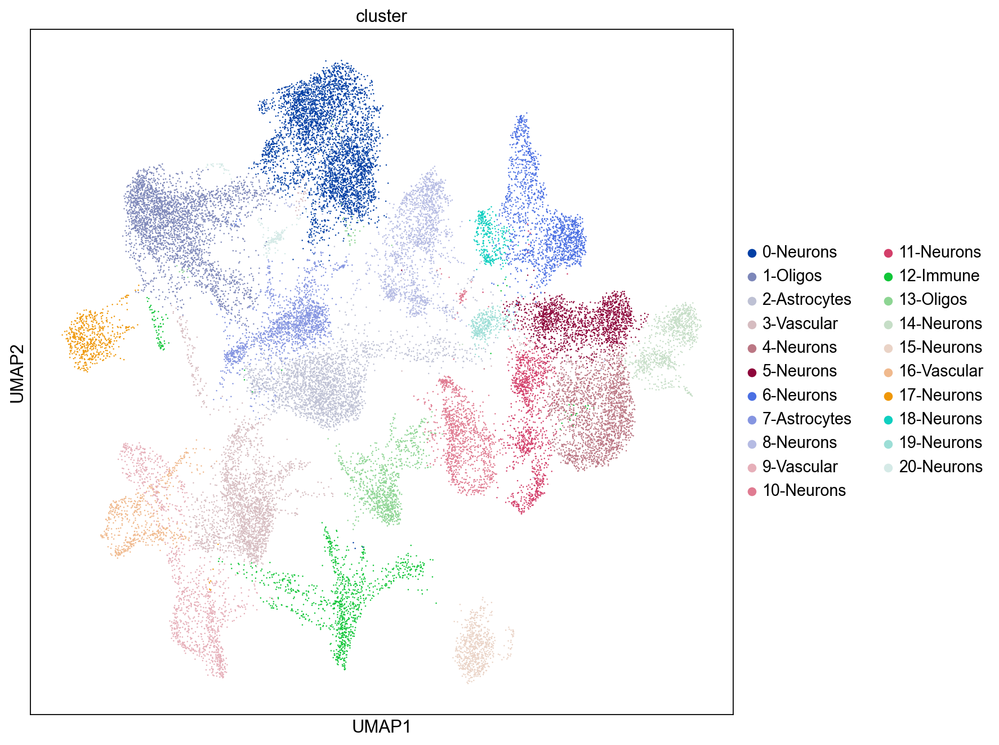

In [31]:
sc.pl.umap(adata, color = 'cluster', size = 5)

C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\squidpy\pl\_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


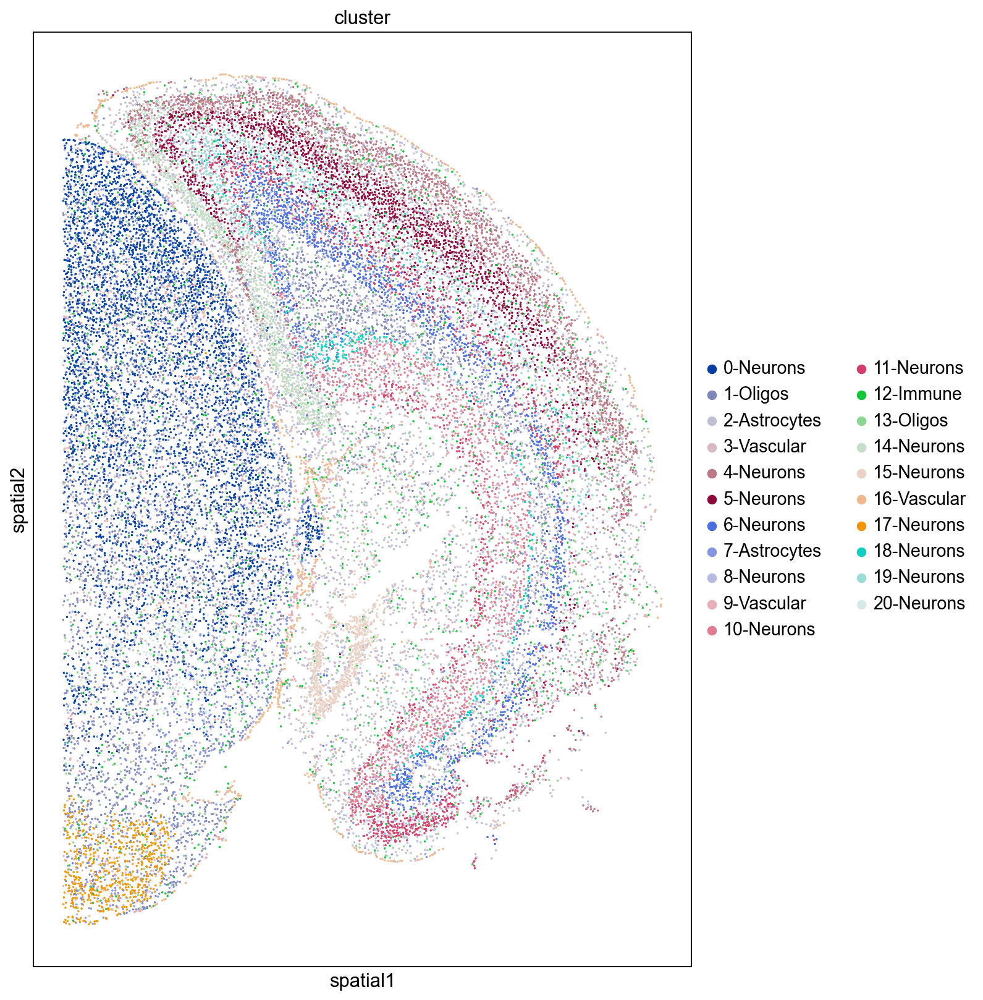

In [38]:
sq.pl.spatial_scatter(
    adata,
    shape = None, color = 'cluster', size = 0.75,
    library_id = 'spatial', figsize=(10,10))

C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


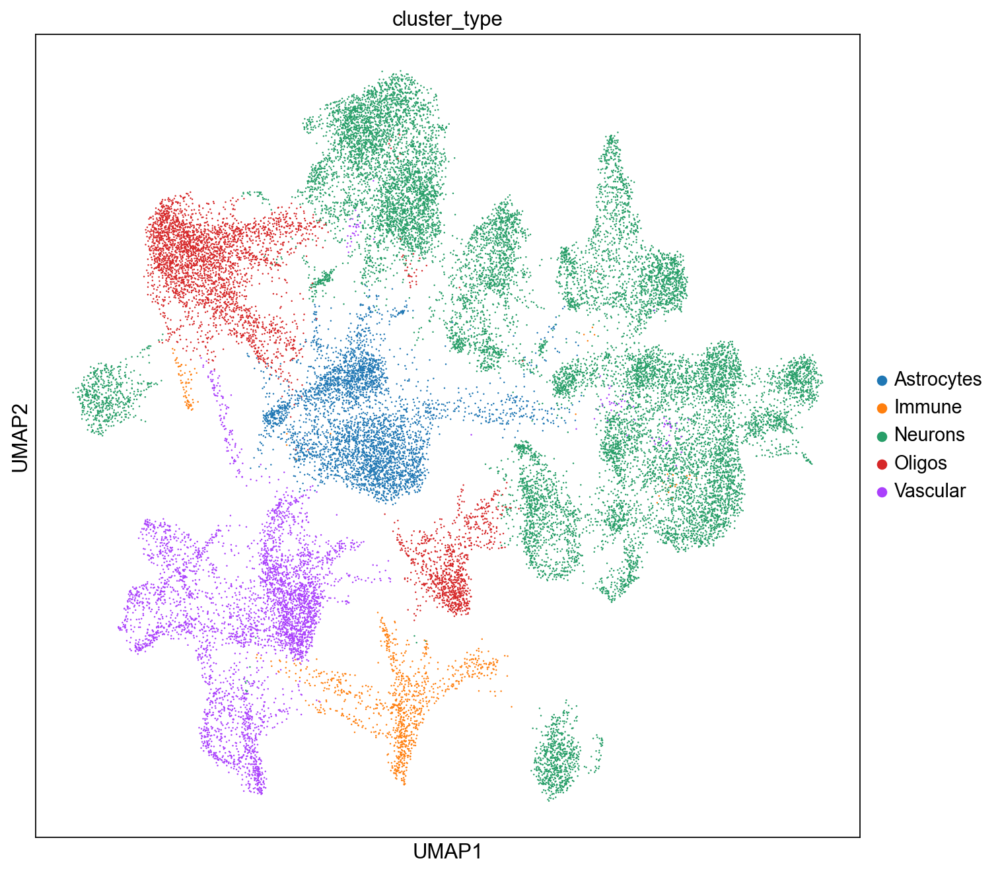

In [33]:
sc.pl.umap(adata, color = 'cluster_type', size = 5)

C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\squidpy\pl\_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


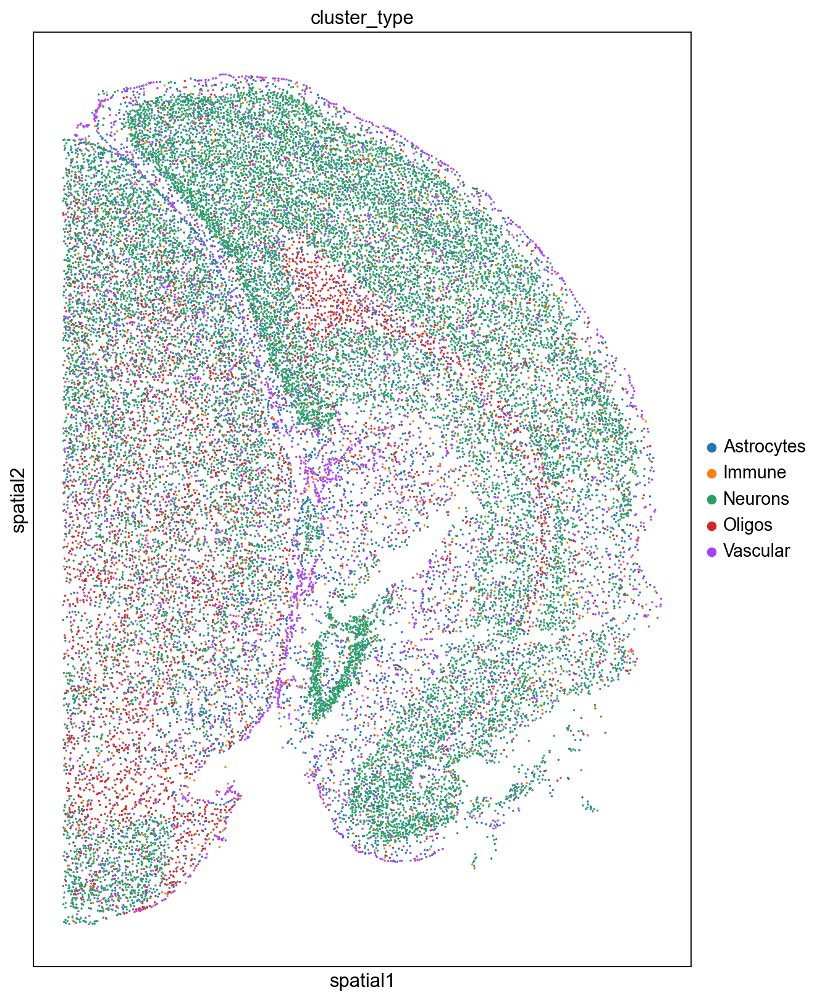

In [60]:
sq.pl.spatial_scatter(
    adata,
    shape = None, color = 'cluster_type', size = .75,
    library_id = 'spatial', figsize=(10,10))

In [40]:
sq.gr.spatial_neighbors(adata, coord_type = 'generic', spatial_key = 'spatial')
sq.gr.nhood_enrichment(adata, cluster_key = 'cluster')

  0%|          | 0/1000 [00:00<?, ?/s]

Going to follow the example [workflow](https://squidpy.readthedocs.io/en/stable/notebooks/examples/graph/compute_ligrec.html) provided by squidpy to run receptor-ligand analysis with a re-implementation of cellphonedb. 

In [42]:
res = sq.gr.ligrec(
    adata,
    n_perms = 100,
    cluster_key = 'cluster',
    copy = True,
    use_raw = False,
    interaction_params={'resources':'CellPhoneDB'},
    transmitter_params ={'categories':'ligand'},
    receiver_params = {'categories':'receptor'})

  0%|          | 0/100 [00:00<?, ?permutation/s]

In [43]:
res['means'].shape

(106, 441)

In [44]:
res['means'].sum(axis=1)

source   target
KIT      PDGFRB     34.468446
NRP1     PDGFRB     54.784865
CXCL12   EPHB2      56.554916
FLT4     KDR        11.153305
NRP1     KDR        39.997411
                      ...    
SLC17A7  GRM6       55.230313
SLC17A8  GRM6       11.207606
SLC17A6  GRIN2B     56.188130
SLC17A7  GRIN2B    111.384537
SLC17A8  GRIN2B     35.638595
Length: 106, dtype: float64

In [45]:
res['pvalues'].head()

cluster_1     0-Neurons                                                     \
cluster_2     0-Neurons 1-Oligos 10-Neurons 11-Neurons 12-Immune 13-Oligos   
source target                                                                
KIT    PDGFRB       NaN      NaN        NaN        NaN       NaN       NaN   
NRP1   PDGFRB       NaN      NaN        NaN        NaN       NaN       NaN   
CXCL12 EPHB2        NaN      NaN        NaN        NaN       NaN       NaN   
FLT4   KDR          NaN      NaN        NaN        NaN       NaN       NaN   
NRP1   KDR          NaN      NaN        NaN        NaN       NaN       NaN   

cluster_1                                                   ... 9-Vascular  \
cluster_2     14-Neurons 15-Neurons 16-Vascular 17-Neurons  ... 19-Neurons   
source target                                               ...              
KIT    PDGFRB        NaN        NaN         0.0        NaN  ...        NaN   
NRP1   PDGFRB        NaN        NaN         NaN        NaN  ...        NaN   
CXCL12 EPHB2         NaN        NaN         NaN        NaN  ...        0.0   
FLT4   KDR           NaN        NaN         NaN        NaN  ...        NaN   
NRP1   KDR           NaN        NaN         NaN        NaN  ...        NaN   

cluster_1                                                             \
cluster_2     2-Astrocytes 20-Neurons 3-Vascular 4-Neurons 5-Neurons   
source target                                                          
KIT    PDGFRB          NaN        NaN        NaN       NaN       NaN   
NRP1   PDGFRB          0.0        NaN        NaN       NaN       NaN   
CXCL12 EPHB2           NaN        0.0        NaN       0.0       0.0   
FLT4   KDR             NaN        NaN        0.0       NaN       NaN   
NRP1   KDR             NaN        NaN        0.0       NaN       NaN   

cluster_1                                                  
cluster_2     6-Neurons 7-Astrocytes 8-Neurons 9-Vascular  
source target                                              
KIT    PDGFRB       NaN          NaN       NaN        NaN  
NRP1   PDGFRB       NaN          0.0       NaN        0.0  
CXCL12 EPHB2        0.0          NaN       NaN        NaN  
FLT4   KDR          NaN          NaN       NaN        0.0  
NRP1   KDR          NaN          NaN       NaN        0.0  

[5 rows x 441 columns]

In [46]:
res['metadata'].head()

,,aspect_intercell_source,aspect_intercell_target,category_intercell_source,category_intercell_target,category_source_intercell_source,category_source_intercell_target,consensus_direction,consensus_inhibition,consensus_score_intercell_source,consensus_score_intercell_target,...,scope_intercell_source,scope_intercell_target,secreted_intercell_source,secreted_intercell_target,sources,transmitter_intercell_source,transmitter_intercell_target,type,uniprot_intercell_source,uniprot_intercell_target
source,target,,,,,,,,,,,,,,,,,,,,,
KIT,PDGFRB,functional,functional,ligand,receptor,resource_specific,resource_specific,False,False,1,21,...,generic,generic,False,False,HPRD_MIMP;KEA;MIMP;NetworKIN_KEA;PhosphoSite_M...,True,False,post_translational,P10721,P09619
NRP1,PDGFRB,functional,functional,ligand,receptor,resource_specific,resource_specific,False,False,2,21,...,generic,generic,True,False,Cellinker,True,False,post_translational,O14786,P09619
CXCL12,EPHB2,functional,functional,ligand,receptor,resource_specific,resource_specific,True,False,21,20,...,generic,generic,True,False,Wang,True,False,post_translational,P48061,P29323
FLT4,KDR,functional,functional,ligand,receptor,resource_specific,resource_specific,False,False,1,23,...,generic,generic,True,True,HPRD;IntAct;Li2012;PhosphoPoint;SPIKE_LC,True,False,post_translational,P35916,P35968
NRP1,KDR,functional,functional,ligand,receptor,resource_specific,resource_specific,True,False,2,23,...,generic,generic,True,True,BioGRID;CellChatDB-cofactors;HPRD;SPIKE_LC;Wang,True,False,post_translational,O14786,P35968


C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


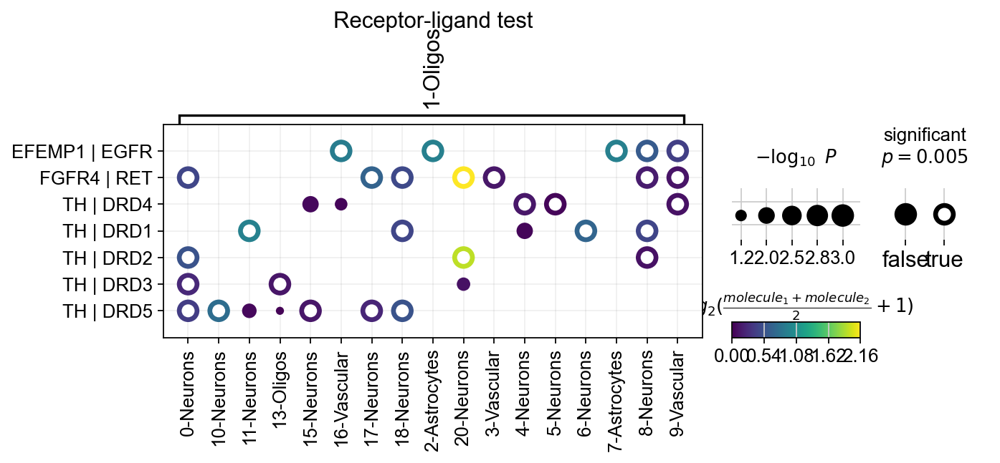

In [48]:
sq.pl.ligrec(res, source_groups = '1-Oligos', alpha = 0.005)

C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


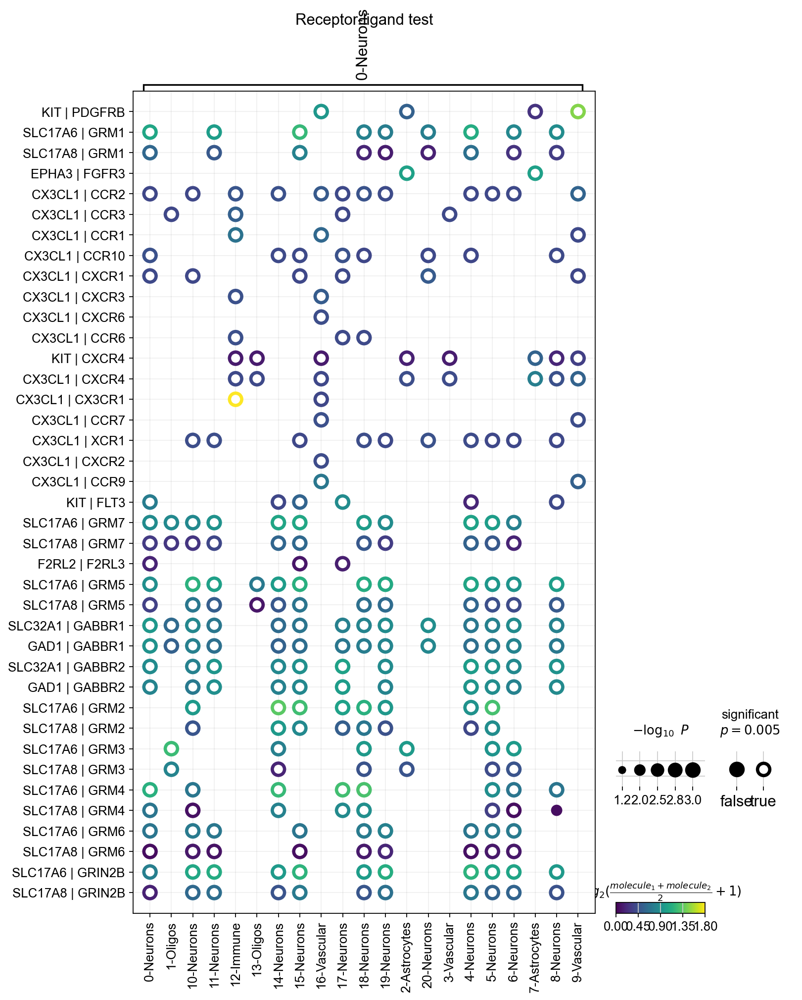

In [50]:
sq.pl.ligrec(res, source_groups = '0-Neurons', alpha = 0.005)

In [56]:
adata.uns['cluster_colors_og'] = adata.uns['cluster_colors']

0


C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


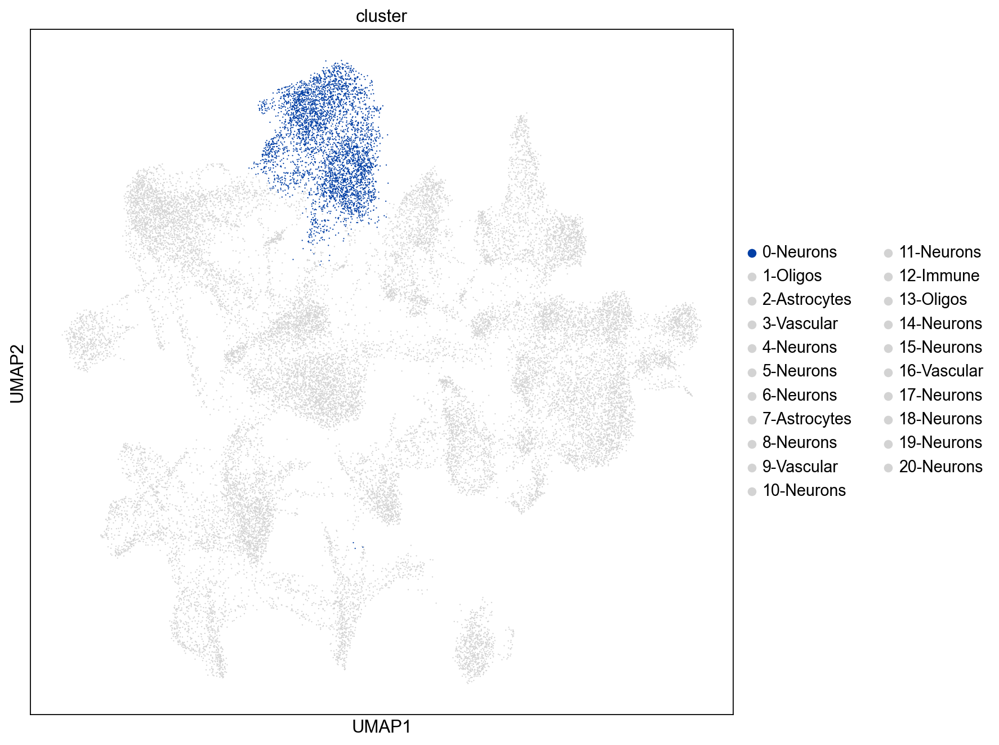

C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\squidpy\pl\_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


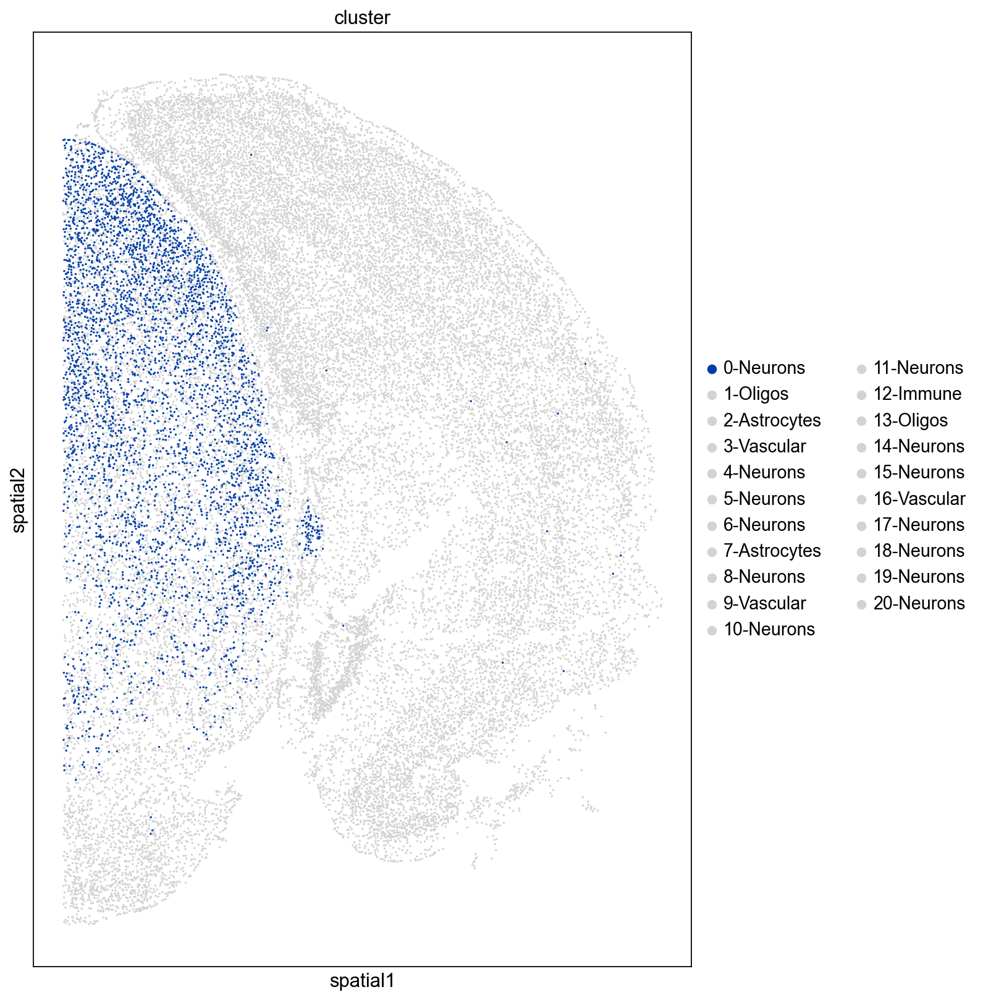

In [63]:
for i in range(0,len(adata.uns['cluster_colors'])):
    print(i)
    adata.uns['cluster_colors'] = {str(i): '#d3d3d3' for i in range(len(adata.uns['cluster_colors']))}
    adata.uns['cluster_colors'] = ['#d3d3d3']*len(adata.uns['cluster_colors'])
    adata.uns['cluster_colors'][i] = adata.uns['cluster_colors_og'][i]
    
    # print(adata.uns['leiden_colors'])
    
    sc.pl.umap(adata, color = 'cluster')
    
    sq.pl.spatial_scatter(
        adata,
        shape = None, color = 'cluster', size = .75,
        library_id = 'spatial', figsize=(10,10))
    
    break
    # if i == 2:
    #     break

In [65]:
res.keys()

dict_keys(['means', 'pvalues', 'metadata'])

In [67]:
res['means']

cluster_1      0-Neurons                                                     \
cluster_2      0-Neurons 1-Oligos 10-Neurons 11-Neurons 12-Immune 13-Oligos   
source  target                                                                
KIT     PDGFRB  0.000000      0.0   0.000000   0.000000       0.0       0.0   
NRP1    PDGFRB  0.000000      0.0   0.000000   0.000000       0.0       0.0   
CXCL12  EPHB2   0.000000      0.0   0.000000   0.000000       0.0       0.0   
FLT4    KDR     0.000000      0.0   0.000000   0.000000       0.0       0.0   
NRP1    KDR     0.000000      0.0   0.000000   0.000000       0.0       0.0   
...                  ...      ...        ...        ...       ...       ...   
SLC17A7 GRM6    0.000000      0.0   0.000000   0.000000       0.0       0.0   
SLC17A8 GRM6    0.043997      0.0   0.085024   0.061899       0.0       0.0   
SLC17A6 GRIN2B  0.701910      0.0   1.106571   1.146085       0.0       0.0   
SLC17A7 GRIN2B  0.000000      0.0   0.000000   0.000000       0.0       0.0   
SLC17A8 GRIN2B  0.121058      0.0   0.525719   0.565233       0.0       0.0   

cluster_1                                                    ... 9-Vascular  \
cluster_2      14-Neurons 15-Neurons 16-Vascular 17-Neurons  ... 19-Neurons   
source  target                                               ...              
KIT     PDGFRB   0.000000   0.000000    0.938835        0.0  ...   0.000000   
NRP1    PDGFRB   0.000000   0.000000    0.000000        0.0  ...   0.000000   
CXCL12  EPHB2    0.000000   0.000000    0.000000        0.0  ...   0.813407   
FLT4    KDR      0.000000   0.000000    0.000000        0.0  ...   0.000000   
NRP1    KDR      0.000000   0.000000    0.000000        0.0  ...   0.000000   
...                   ...        ...         ...        ...  ...        ...   
SLC17A7 GRM6     0.000000   0.000000    0.000000        0.0  ...   0.000000   
SLC17A8 GRM6     0.000000   0.045520    0.000000        0.0  ...   0.000000   
SLC17A6 GRIN2B   0.962550   1.243473    0.000000        0.0  ...   0.000000   
SLC17A7 GRIN2B   0.000000   0.000000    0.000000        0.0  ...   0.000000   
SLC17A8 GRIN2B   0.381698   0.662621    0.000000        0.0  ...   0.000000   

cluster_1                                                              \
cluster_2      2-Astrocytes 20-Neurons 3-Vascular 4-Neurons 5-Neurons   
source  target                                                          
KIT     PDGFRB     0.000000   0.000000   0.000000   0.00000  0.000000   
NRP1    PDGFRB     0.651292   0.000000   0.000000   0.00000  0.000000   
CXCL12  EPHB2      0.000000   0.723769   0.000000   0.57345  0.608849   
FLT4    KDR        0.000000   0.000000   1.719814   0.00000  0.000000   
NRP1    KDR        0.000000   0.000000   1.614080   0.00000  0.000000   
...                     ...        ...        ...       ...       ...   
SLC17A7 GRM6       0.000000   0.000000   0.000000   0.00000  0.000000   
SLC17A8 GRM6       0.000000   0.000000   0.000000   0.00000  0.000000   
SLC17A6 GRIN2B     0.000000   0.000000   0.000000   0.00000  0.000000   
SLC17A7 GRIN2B     0.000000   0.000000   0.000000   0.00000  0.000000   
SLC17A8 GRIN2B     0.000000   0.000000   0.000000   0.00000  0.000000   

cluster_1                                                   
cluster_2      6-Neurons 7-Astrocytes 8-Neurons 9-Vascular  
source  target                                              
KIT     PDGFRB  0.000000     0.000000       0.0   0.000000  
NRP1    PDGFRB  0.000000     0.385539       0.0   1.945823  
CXCL12  EPHB2   0.763585     0.000000       0.0   0.000000  
FLT4    KDR     0.000000     0.000000       0.0   0.868836  
NRP1    KDR     0.000000     0.000000       0.0   0.763102  
...                  ...          ...       ...        ...  
SLC17A7 GRM6    0.000000     0.000000       0.0   0.000000  
SLC17A8 GRM6    0.000000     0.000000       0.0   0.000000  
SLC17A6 GRIN2B  0.000000     0.000000       0.0   0.000000  
SLC17A7 GRIN2B  0.000000     0.

In [68]:
source = 'FGFR4'
target = 'RET'
cluster_1 = '1-Oligos'
cluster_2 = '20-Neurons'

In [112]:
adata.uns['cluster_colors_og']

['#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7']

In [113]:
levels_ = adata.obs.cluster.cat.categories

C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


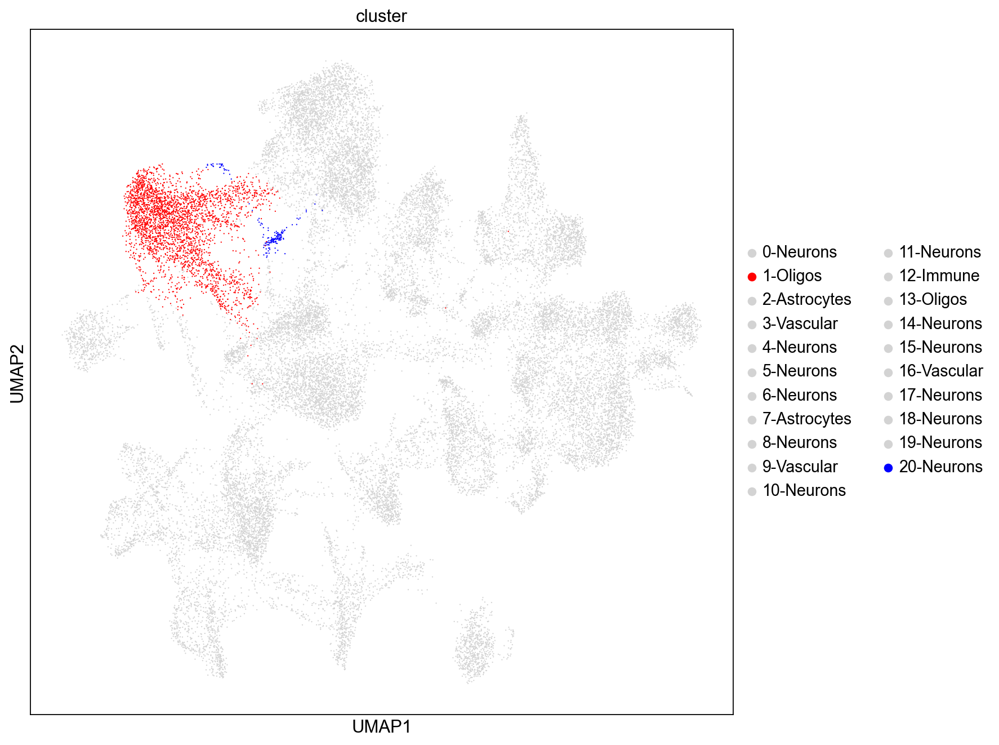

C:\Users\DouglasHannumJr\AppData\Roaming\Python\Python310\site-packages\squidpy\pl\_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


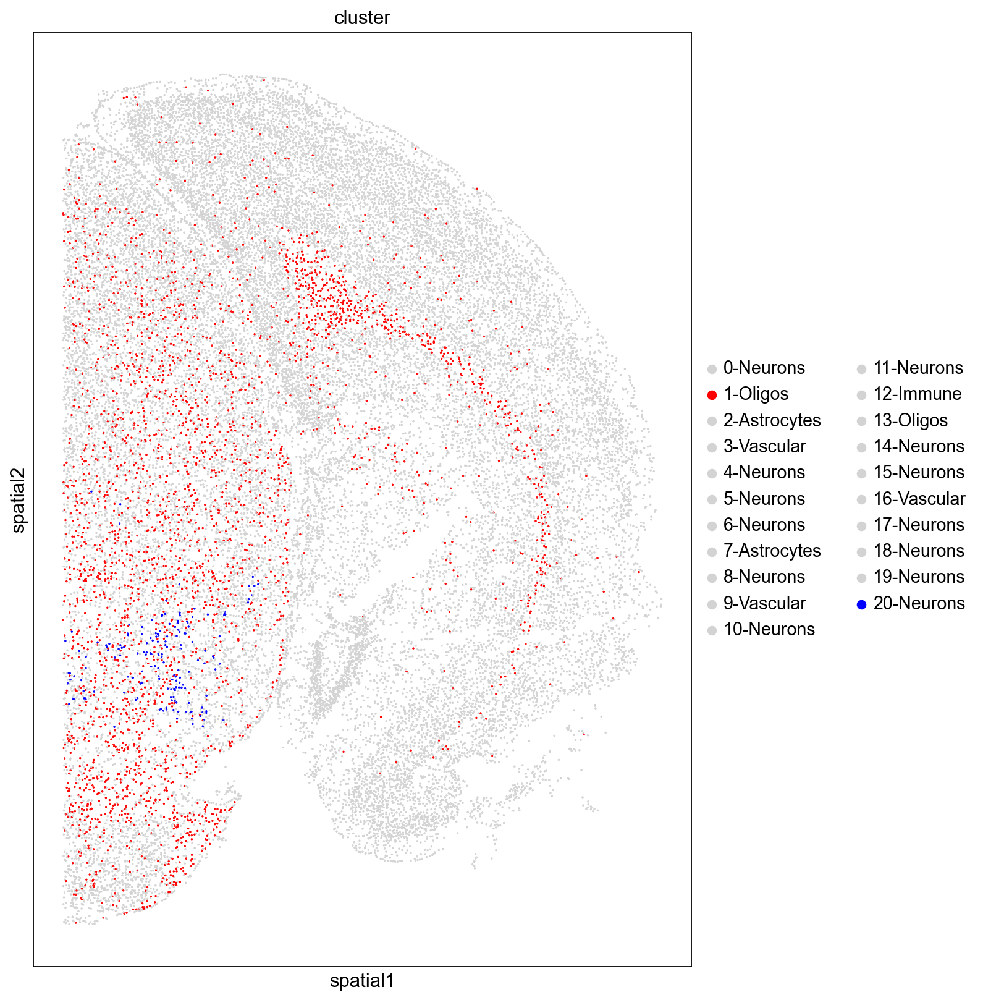

In [114]:
adata.uns['cluster_colors'] = ['#d3d3d3']*len(adata.uns['cluster_colors'])
adata.uns['cluster_colors'][np.where(levels_ == cluster_1)[0][0]] = '#ff0000'
adata.uns['cluster_colors'][np.where(levels_ == cluster_2)[0][0]] = '#0000ff'

# print(adata.uns['leiden_colors'])

sc.pl.umap(adata, color = 'cluster')

sq.pl.spatial_scatter(
    adata,
    shape = None, color = 'cluster', size = .75,
    library_id = 'spatial', figsize=(10,10))